## Project overview

In this project, we are going to use the [Seattle Airbnb data](https://www.kaggle.com/datasets/airbnb/seattle/data) and analyze it to find the best place to stay when you travel to the city.

We will focus on three main subjects.
1. analyze if there is a cheaper area than the others.
2. analyze if review scores are related to the district(area) where Airbnb is.
3. analyze if guests have a better experience when they stay at more expensive places.

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

from geo_visualization import create_folium_colormap, draw_circle_marker_map

<br>
<br>
<br>

### Load data and EDA

In [2]:
seattle_listings = pd.read_csv('./data/seattle/listings.csv')
seattle_listings.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15


In [3]:
print(f'number of rows: {len(seattle_listings)}')

number of rows: 3818


In [5]:
seattle_listing_ids = seattle_listings['id']
print(f'number of IDs: {len(seattle_listing_ids)}')
print(f'number of unique IDs: {len(seattle_listing_ids.unique())}')

number of IDs: 3818
number of unique IDs: 3818


In [6]:
seattle_listings.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

In [13]:
seattle_listings['review_scores_value'].describe()

count    3162.000000
mean        9.452245
std         0.750259
min         2.000000
25%         9.000000
50%        10.000000
75%        10.000000
max        10.000000
Name: review_scores_value, dtype: float64

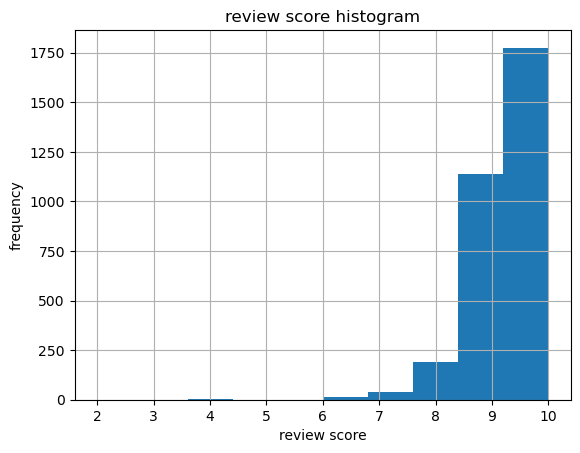

In [9]:
seattle_listings['review_scores_value'].hist()
plt.title('review score histogram')
plt.xlabel('review score')
plt.ylabel('frequency')
plt.show()

In [10]:
seattle_listings['price'].describe()

count        3818
unique        273
top       $150.00
freq          162
Name: price, dtype: object

In [14]:
seattle_listings['review_scores_value'].isna().sum()

656

In [11]:
seattle_listings['price'].isna().sum()

0

<br>
<br>
<br>

### Data Wrangling

In [13]:
review_missing_perc = seattle_listings['review_scores_value'].isna().sum() / len(seattle_listings['review_scores_value'])
print(f'{review_missing_perc * 100:.02f}% of review scores are missing')

17.18% of review scores are missing


Review scores are key for the analysis and
filling some into the missing values is not quite what I want here.

82.8% of data is still available and it seems enough as seen below because Airbnbs seem randomly distributed over the map of the city.

In [17]:
seattle_coords = [47.6062, -122.3321]

In [18]:
seattle_listings_reviewed = seattle_listings.loc[~seattle_listings['review_scores_value'].isna()]

In [19]:
review_score_colormap = create_folium_colormap(data=seattle_listings_reviewed,
                                               criterion='review_scores_value',
                                               colors=['#8B0000', '#FFD700', '#006400'])

In [22]:
draw_circle_marker_map(data=seattle_listings_reviewed,
                       color_feature='review_scores_value',
                       colormap=review_score_colormap,
                       coords=seattle_coords,
                       marker_radius=4,
                       marker_border_color=None,
                       marker_border_width=0,
                       marker_fill_opacity=0.7)

Convert string type to numeric type for price column

In [23]:
seattle_listings_reviewed['price'] = seattle_listings_reviewed['price'].str.replace('$', '')
seattle_listings_reviewed['price'] = seattle_listings_reviewed['price'].str.replace(',', '')
seattle_listings_reviewed['price'] = seattle_listings_reviewed['price'].astype(float)

C:\Users\inwo9\AppData\Local\Temp\ipykernel_13908\3383558206.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seattle_listings_reviewed['price'] = seattle_listings_reviewed['price'].str.replace('$', '')
C:\Users\inwo9\AppData\Local\Temp\ipykernel_13908\3383558206.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seattle_listings_reviewed['price'] = seattle_listings_reviewed['price'].str.replace(',', '')
C:\Users\inwo9\AppData\Local\Temp\ipykernel_13908\3383558206.py:3: SettingWithCopyWarning: 
A value 

<br>
<br>
<br>

### 1. Is there a cheaper area than the rest areas?

**Ans**: No, they seem randomly distributed.

In [24]:
price_folium_colormap = create_folium_colormap(data=seattle_listings_reviewed,
                                               criterion='price',
                                               colors=['#006400', '#FFD700', '#8B0000'])

In [25]:
draw_circle_marker_map(data=seattle_listings_reviewed,
                       color_feature='price',
                       colormap=price_folium_colormap,
                       coords=seattle_coords,
                       marker_radius=4,
                       marker_border_color=None,
                       marker_border_width=0,
                       marker_fill_opacity=0.7)

<br>

#### Let's separate expensive and cheap places. Is there a difference?

**Ans**: Yes, expensive ones seem concentrated in a few areas.

In [26]:
pricey_seattle_listings_reviewed = seattle_listings_reviewed.loc[seattle_listings_reviewed['price'] > 400]

draw_circle_marker_map(data=pricey_seattle_listings_reviewed,
                       color_feature='price',
                       colormap=price_folium_colormap,
                       coords=seattle_coords,
                       marker_radius=6,
                       marker_border_color='#000000',
                       marker_border_width=1,
                       marker_fill_opacity=0.9)

In [28]:
cheap_seattle_listings_reviewed = seattle_listings_reviewed.loc[seattle_listings_reviewed['price'] < 50]

draw_circle_marker_map(data=cheap_seattle_listings_reviewed,
                       color_feature='price',
                       colormap=price_folium_colormap,
                       coords=seattle_coords,
                       marker_radius=4,
                       marker_border_color=None,
                       marker_border_width=0,
                       marker_fill_opacity=0.7)

<br>
<br>
<br>

### 2. Do areas affect review scores?

**Ans**: No, we have actually seen this above and review scores seem randomly distributed

In [29]:
draw_circle_marker_map(data=seattle_listings_reviewed,
                       color_feature='review_scores_value',
                       colormap=review_score_colormap,
                       coords=seattle_coords,
                       marker_radius=4,
                       marker_border_color=None,
                       marker_border_width=0,
                       marker_fill_opacity=0.7)

<br>

#### Let's also separate high and low review scores. Do you find a difference?

**Ans**: Yes, poorly reviwed places are somewhat concentrated in a few areas

In [30]:
seattle_listings_w_low_review_scores = seattle_listings_reviewed.loc[seattle_listings_reviewed['review_scores_value'] < 7.2]

draw_circle_marker_map(data=seattle_listings_w_low_review_scores,
                       color_feature='review_scores_value',
                       colormap=review_score_colormap,
                       coords=seattle_coords,
                       marker_radius=7,
                       marker_border_color='#000000',
                       marker_border_width=1,
                       marker_fill_opacity=0.7)

In [31]:
seattle_listings_w_high_review_scores = seattle_listings_reviewed.loc[seattle_listings_reviewed['review_scores_value'] >= 9.2]

draw_circle_marker_map(data=seattle_listings_w_high_review_scores,
                       color_feature='review_scores_value',
                       colormap=review_score_colormap,
                       coords=seattle_coords,
                       marker_radius=4,
                       marker_border_color=None,
                       marker_border_width=0,
                       marker_fill_opacity=0.7)

After analyzing this part, I found this extra information, [seattle crime map](https://gisgeography.com/seattle-crime-map/)

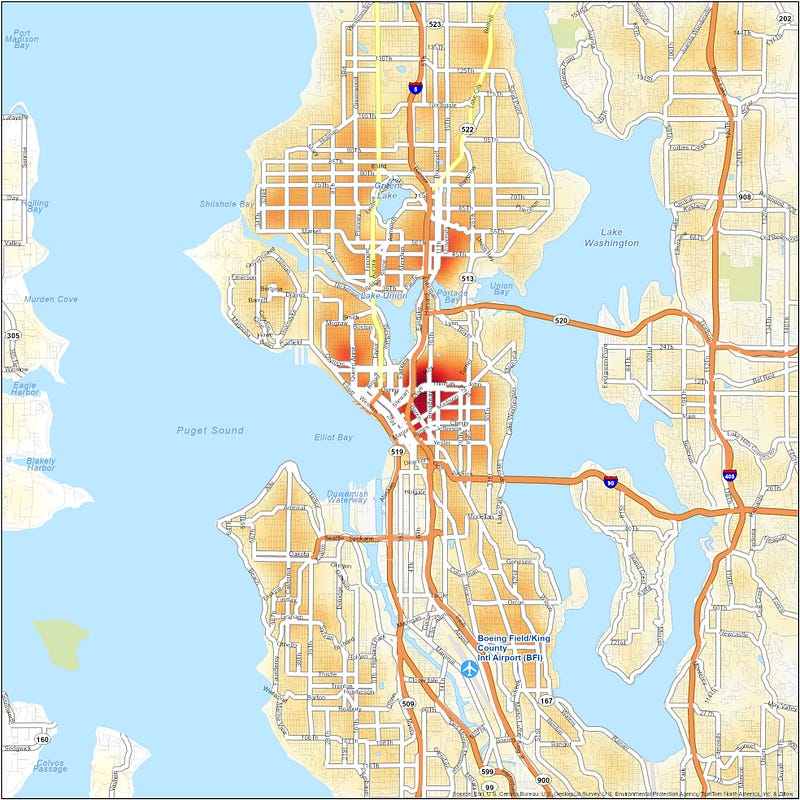

You can see areas where crimes occur are pretty aligned to where poorly reviewed Airbnb places!

<br>
<br>
<br>

### 3. Does pricey Airbnb result in high review scores?

**Ans**: No, they seem similar. (cheap ones' average review score is even slightly higher)

### how cheap and expensive rents are reviewed?

In [33]:
print(f'expensive airbnb average review score: {pricey_seattle_listings_reviewed['review_scores_value'].mean()}')
print(f'cheap airbnb average review score: {cheap_seattle_listings_reviewed['review_scores_value'].mean()}')

expensive airbnb average review score: 9.442307692307692
cheap airbnb average review score: 9.475555555555555


<br>

Airbnb places that cost over $400 per night

In [33]:
draw_circle_marker_map(data=pricey_seattle_listings_reviewed,
                       color_feature='review_scores_value',
                       colormap=review_score_colormap,
                       coords=seattle_coords,
                       marker_radius=6,
                       marker_border_color='#000000',
                       marker_border_width=1,
                       marker_fill_opacity=0.9)

<br>

Airbnb places that cost less than $50 per night

In [34]:
draw_circle_marker_map(data=cheap_seattle_listings_reviewed,
                       color_feature='review_scores_value',
                       colormap=review_score_colormap,
                       coords=seattle_coords,
                       marker_radius=5,
                       marker_border_color='#000000',
                       marker_border_width=1,
                       marker_fill_opacity=0.9)

<br>
<br>
<br>

### Conclusion

- Most touristy places are located in Belltown such as the Space Needle and Pike Place Market. Therefore you could consider this factor for good accessibility.
- Airbnb price is independent of the location as long as many Airbnb places are available.
- It is good to avoid areas where crimes happen often. 

Considering all these factors I recommend **West Queen Anne** which has good accessibility and is safe enough, and it also has a great view of the downtown at Kinnear Park.

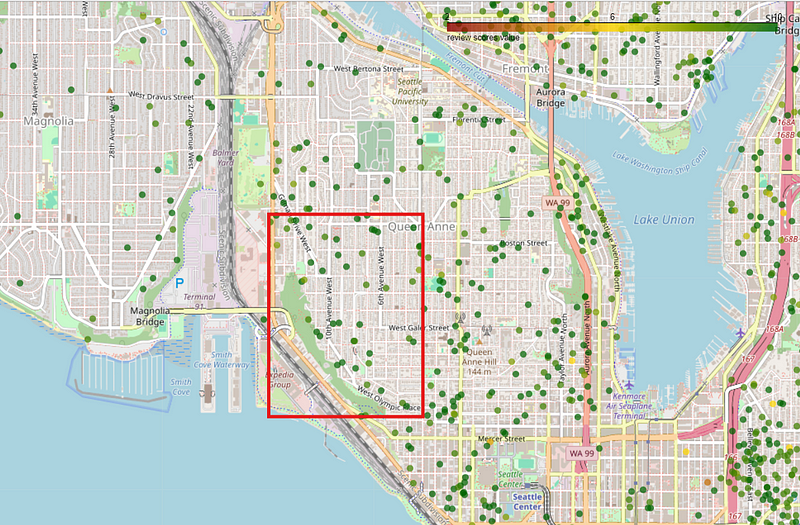